In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

import datasets
from datasets import load_dataset
from sentence_transformers import SentenceTransformer

import os
import requests
from tqdm import tqdm
import pickle 
from PIL import Image
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import requests

In [2]:
model = SentenceTransformer("sentence-transformers/clip-ViT-B-32").to('cuda')

/home/samuel/anaconda2/envs/env_instruct_align/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


# Load Dataset

### Load Reference Datasets

In [3]:
%%time
sea_vqa_images_filt, sea_vqa_images_embed, sea_vqa_caption, sea_vqa_culture = pickle.load(open('sea_vqa.pkl', 'rb'))
cvqa_images_filt, cvqa_images_embed, cvqa_caption, cvqa_culture = pickle.load(open('cvqa.pkl', 'rb'))

ref_images_filt = sea_vqa_images_filt + cvqa_images_filt
ref_images_embed = sea_vqa_images_embed + cvqa_images_embed
ref_vqa_caption = sea_vqa_caption + cvqa_caption
ref_vqa_culture = sea_vqa_culture + cvqa_culture

CPU times: user 10.2 s, sys: 31.8 s, total: 42 s
Wall time: 42 s


### Load Target Filtering Datasets

In [4]:
%%time
cc3m_val_images_filt, cc3m_val_images_embed, cc3m_val_caption, _ = pickle.load(open('./cc3m_val.pkl', 'rb'))
cc3m_trn_images_filt, cc3m_trn_images_embed, cc3m_trn_caption, _ = pickle.load(open('./cc3m_trn.pkl', 'rb'))

CPU times: user 5.29 s, sys: 2.23 s, total: 7.52 s
Wall time: 7.51 s


# Image Similarity

## Validation

In [5]:
%%time
cc3m_val_ref_scores = model.similarity(ref_images_embed, cc3m_val_images_embed)

CPU times: user 2.51 s, sys: 170 ms, total: 2.68 s
Wall time: 1.06 s


/home/samuel/anaconda2/envs/env_instruct_align/lib/python3.10/site-packages/sentence_transformers/util.py:33: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1682343967769/work/torch/csrc/utils/tensor_new.cpp:245.)
  a = torch.tensor(a)


#### SEA-VQA Sample

******* Reference-0 *******
=== Candidate #0 ===
Reference Caption: Which aspect of Cambodian culture is heavily illustrated in this ancient artifact? Celebratory and martial traditions
Candidate Caption: bas - relief at the archeological site
Culture: cambodia
Score:0.7758069634437561


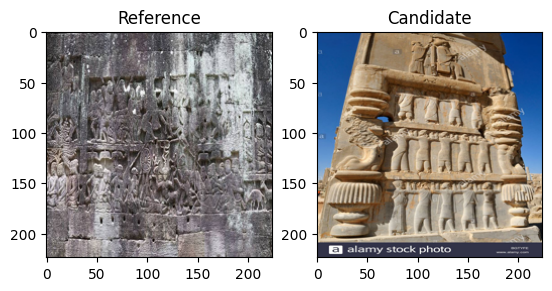

****************************************************************************************************
******* Reference-3 *******
=== Candidate #0 ===
Reference Caption: To what era does this bas-relief belong? 12th-13th century
Candidate Caption: the column on the relief of a bull .
Culture: cambodia
Score:0.77811199426651


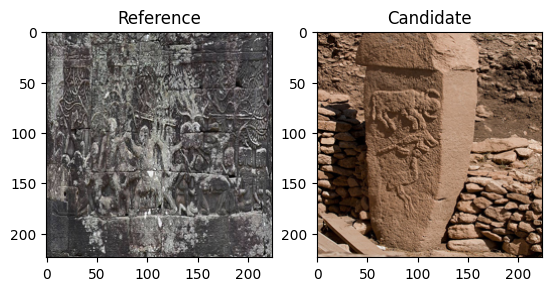

****************************************************************************************************
******* Reference-9 *******
=== Candidate #0 ===
Reference Caption: What could the different colors seen in the decorations signify in Cambodian culture? Representations of different spiritual realms
Candidate Caption: salted fish at a market
Culture: cambodia
Score:0.7725375890731812


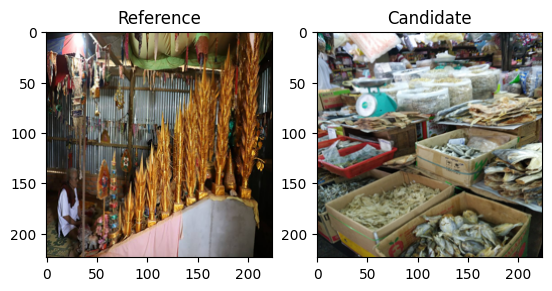

****************************************************************************************************
******* Reference-11 *******
=== Candidate #0 ===
Reference Caption: The facial expressions combined with the gestures in dance primarily aim to: Portray joy and festivity
Candidate Caption: photo of monks in a temple by author
Culture: cambodia
Score:0.7918829321861267


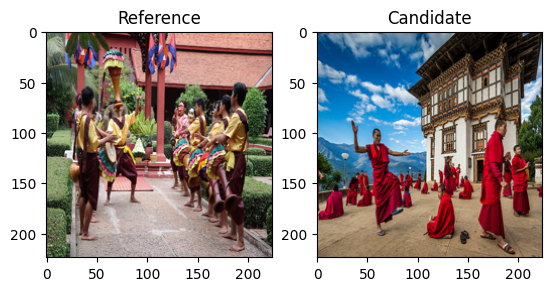

****************************************************************************************************
******* Reference-12 *******
=== Candidate #0 ===
Reference Caption: What is the most probable time of day for this martial arts demonstration based on the lighting and shadows in the image? Midday
Candidate Caption: a group of students from plant
Culture: cambodia
Score:0.7643364071846008


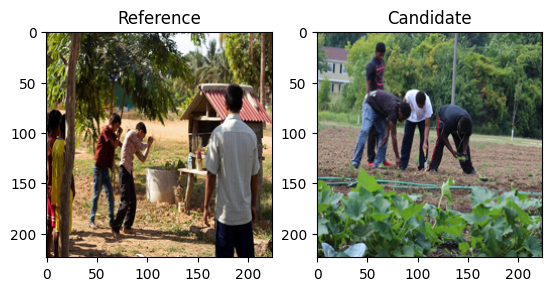

****************************************************************************************************
******* Reference-17 *******
=== Candidate #0 ===
Reference Caption: What notable feature of the event is specifically tied to Cambodian cultural practices? The use of mats for the performance
Candidate Caption: the other side of road
Culture: cambodia
Score:0.7197073101997375


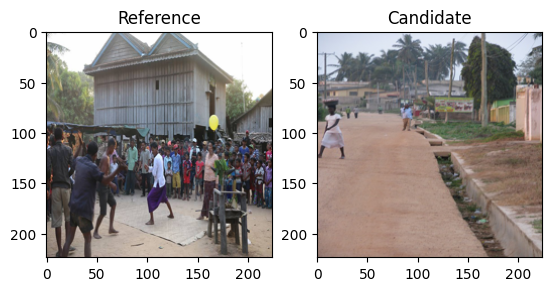

****************************************************************************************************


In [21]:
top_k=1
last_embed = None
for idx in range(20):
    if last_embed is None:
        last_embed = ref_images_embed[idx]
    elif (last_embed == ref_images_embed[idx]).all():
        continue
    elif (last_embed != ref_images_embed[idx]).all():
        last_embed = ref_images_embed[idx]

    sorted_index = np.argsort(np.array(cc3m_val_ref_scores[idx]))[::-1]
    image = ref_images_filt[idx]
    caption = ref_vqa_caption[idx]
    culture = ref_vqa_culture[idx]

    print(f"******* Reference-{idx} *******")
    for rank, cand_idx in enumerate(sorted_index[:top_k]):
        print(f"=== Candidate #{rank} ===")
        print(f"Reference Caption: {caption}")
        print(f"Candidate Caption: {cc3m_val_caption[cand_idx]}")
        print(f"Culture: {culture}")
        print(f"Score:{cc3m_val_ref_scores[idx][cand_idx]}")

        fig, (ax1, ax2) = plt.subplots(1, 2)

        # Display the first PIL Image in the left subplot
        ax1.imshow(image.resize((224, 224), Image.BICUBIC))
        ax1.set_title('Reference')

        # Display the second PIL Image in the right subplot
        ax2.imshow(Image.open(requests.get(cc3m_val_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
        ax2.set_title('Candidate')
        plt.show()
    print("*"*100)

#### CVQA Sample

******* Reference-3676 *******
=== Candidate #0 ===
Reference Caption: Which building is the souvenir based on? Petronas Twin Towers, Kuala Lumpur Tower, Merdeka 118, The Exchange 106
Candidate Caption: version of the modular building .
Culture: Sundanese
Score:0.7122842073440552


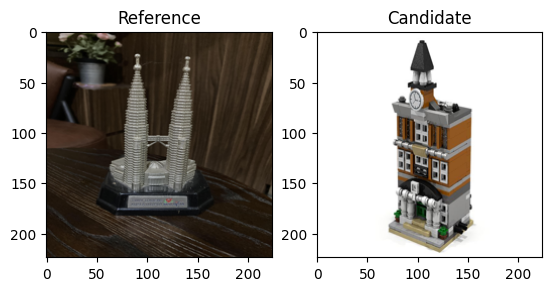

****************************************************************************************************
******* Reference-3677 *******
=== Candidate #0 ===
Reference Caption: What is the name of this monument? Banceuy Prison, Monumen Perjuangan, Gedung Sate, Bandung Lautan Api
Candidate Caption: tourist attraction is a rotating boat lift .
Culture: Sundanese
Score:0.7467098832130432


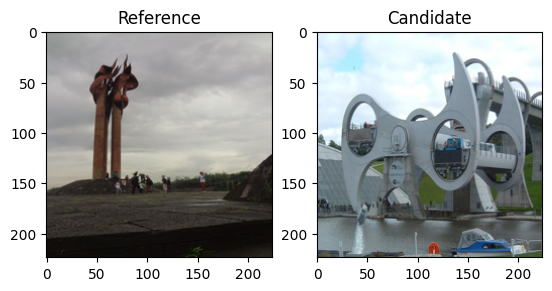

****************************************************************************************************
******* Reference-3678 *******
=== Candidate #0 ===
Reference Caption: What material is used for the roof of the house in this photo? Asbestos, Ceramic, Iron, Rattan
Candidate Caption: typical houses in a countryside small town as seen
Culture: Sundanese
Score:0.8017050623893738


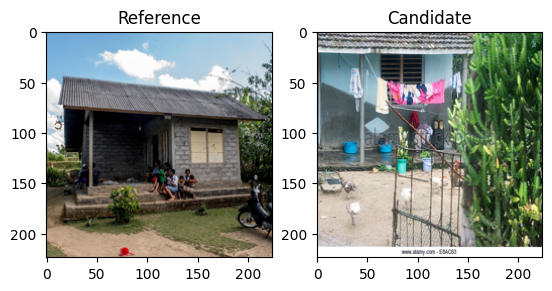

****************************************************************************************************
******* Reference-3679 *******
=== Candidate #0 ===
Reference Caption: What building is this miniature of? Prambanan Temple, Tugu Jogja, Monas, Borobudur Temple
Candidate Caption: sandcastle beach on bright sky .
Culture: Sundanese
Score:0.7281244993209839


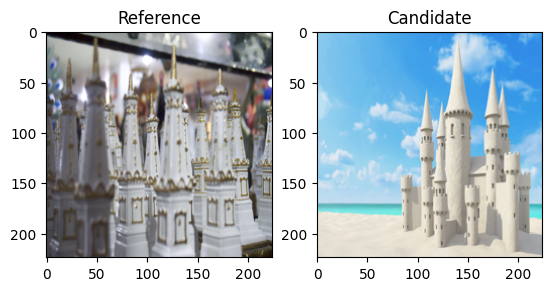

****************************************************************************************************
******* Reference-3680 *******
=== Candidate #0 ===
Reference Caption: Which deity is worshipped on this altar? Buddha, Brahma, Vishnu, Na Tuk Kong
Candidate Caption: street in a city , next to a flower shop and a lot of parked bikes
Culture: Sundanese
Score:0.7699446678161621


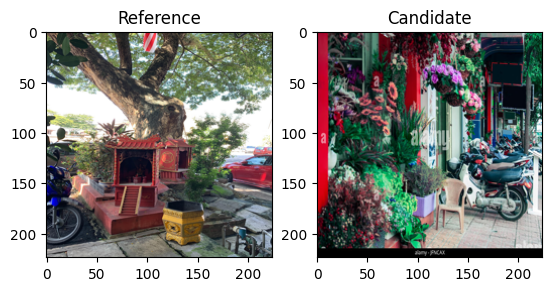

****************************************************************************************************
******* Reference-3681 *******
=== Candidate #0 ===
Reference Caption: What is the use of this tool? Self defense tool, Clothes drying equipment, Cooking tool, Musical instrument
Candidate Caption: in the ministry in the jungle
Culture: Sundanese
Score:0.7815976738929749


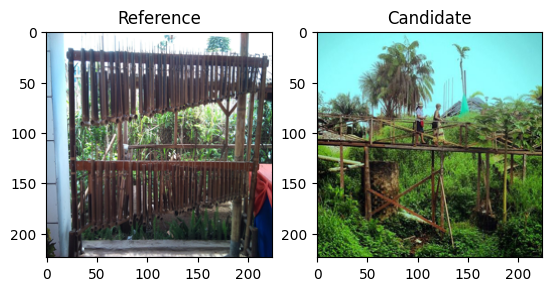

****************************************************************************************************
******* Reference-3682 *******
=== Candidate #0 ===
Reference Caption: What is the name of this building? Soekarno-Hatta Monument, National Inscription, Borobudur Temple, National Monument
Candidate Caption: many of the buildings are very modern , because it is where the elite live
Culture: Sundanese
Score:0.6986941695213318


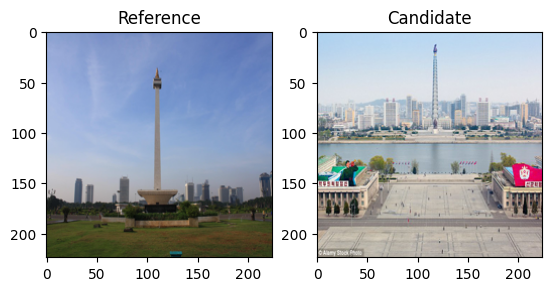

****************************************************************************************************
******* Reference-3683 *******
=== Candidate #0 ===
Reference Caption: Which Indonesian province does this tool come from? West Java, West Sumatra, Bali, Bengkulu
Candidate Caption: in the ministry in the jungle
Culture: Sundanese
Score:0.7815976738929749


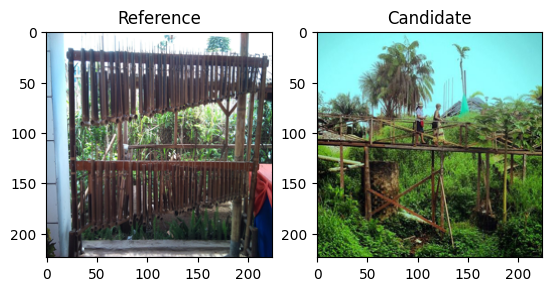

****************************************************************************************************
******* Reference-3684 *******
=== Candidate #0 ===
Reference Caption: What is the name of this building? Government offices, The Sultan Abdul Samad Building, Independence Square, Kuala Lumpur Library
Candidate Caption: colorful old buildings on the vibrant street
Culture: Sundanese
Score:0.7351455688476562


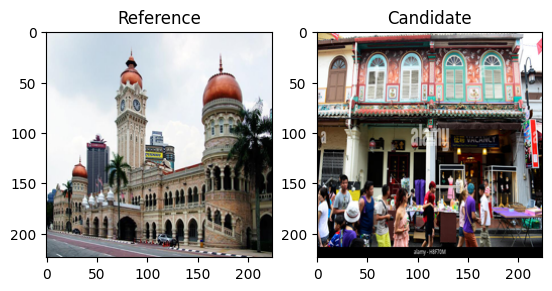

****************************************************************************************************
******* Reference-3685 *******
=== Candidate #0 ===
Reference Caption: What logo is shown in the picture? Telkom University, Harapan Bangsa Institute of Technology, University of Indonesia, Bandung Institute of Technology
Candidate Caption: number on the old metal .
Culture: Sundanese
Score:0.6990058422088623


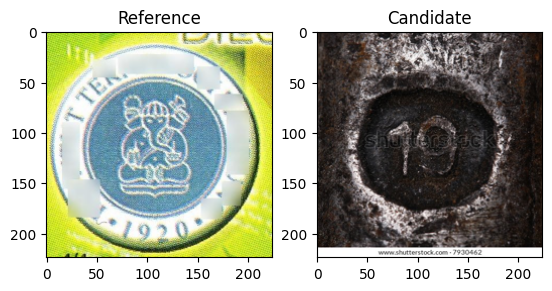

****************************************************************************************************


In [24]:
top_k=1
last_embed = None
for idx in range(len(ref_images_filt) - 10, len(ref_images_filt)):
    if last_embed is None:
        last_embed = ref_images_embed[idx]
    elif (last_embed == ref_images_embed[idx]).all():
        continue
    elif (last_embed != ref_images_embed[idx]).all():
        last_embed = ref_images_embed[idx]

    sorted_index = np.argsort(np.array(cc3m_val_ref_scores[idx]))[::-1]
    image = ref_images_filt[idx]
    caption = ref_vqa_caption[idx]
    culture = ref_vqa_culture[idx]

    print(f"******* Reference-{idx} *******")
    for rank, cand_idx in enumerate(sorted_index[:top_k]):
        print(f"=== Candidate #{rank} ===")
        print(f"Reference Caption: {caption}")
        print(f"Candidate Caption: {cc3m_val_caption[cand_idx]}")
        print(f"Culture: {culture}")
        print(f"Score:{cc3m_val_ref_scores[idx][cand_idx]}")

        fig, (ax1, ax2) = plt.subplots(1, 2)

        # Display the first PIL Image in the left subplot
        ax1.imshow(image.resize((224, 224), Image.BICUBIC))
        ax1.set_title('Reference')

        # Display the second PIL Image in the right subplot
        ax2.imshow(Image.open(requests.get(cc3m_val_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
        ax2.set_title('Candidate')
        plt.show()
    print("*"*100)

#### Mean Vector

******* Mean Reference *******
=== Candidate #0 ===
Candidate Caption: a holy man talks to his devotee during holiday at the courtyard .
Score:0.5697731375694275


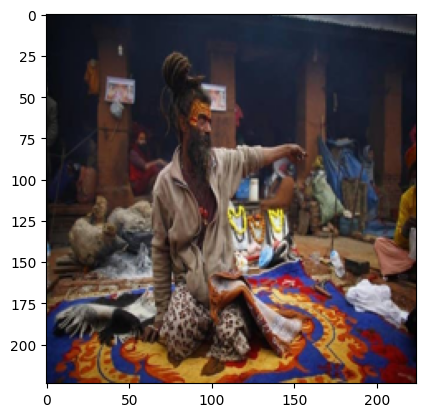

=== Candidate #1 ===
Candidate Caption: day of the dead flowers
Score:0.5634292960166931


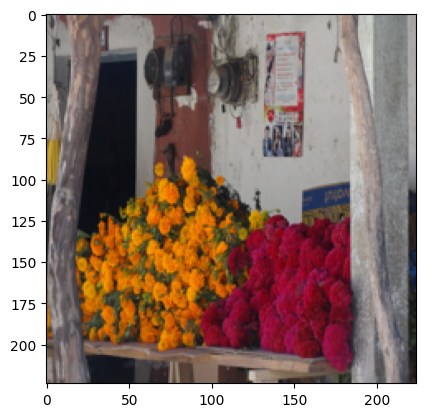

=== Candidate #2 ===
Candidate Caption: dancers before the light switch on
Score:0.5624819993972778


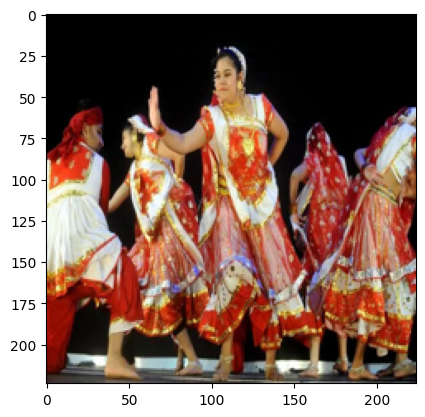

=== Candidate #3 ===
Candidate Caption: typical houses in a countryside small town as seen
Score:0.5601068139076233


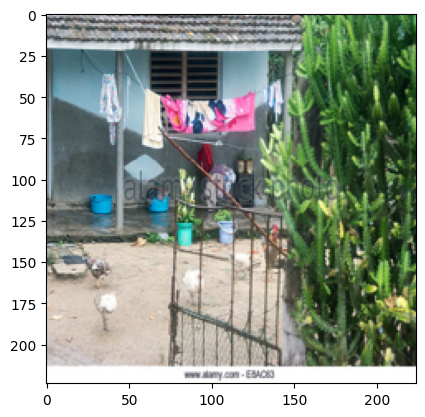

=== Candidate #4 ===
Candidate Caption: salted fish at a market
Score:0.5590294003486633


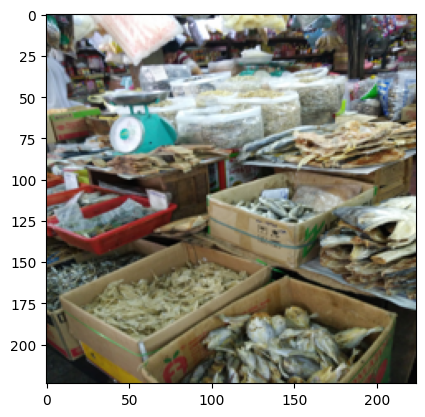

=== Candidate #5 ===
Candidate Caption: barefoot of monk while stand in a row
Score:0.5579625368118286


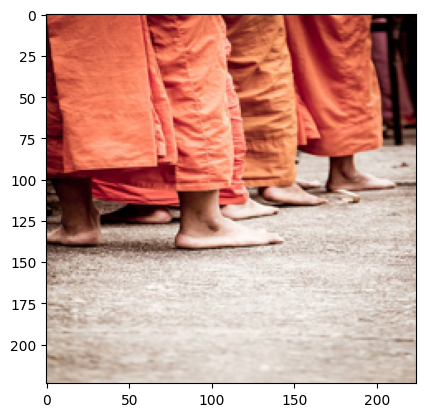

=== Candidate #6 ===
Candidate Caption: besides rice , the region produces large red bricks such as these .
Score:0.5556228160858154


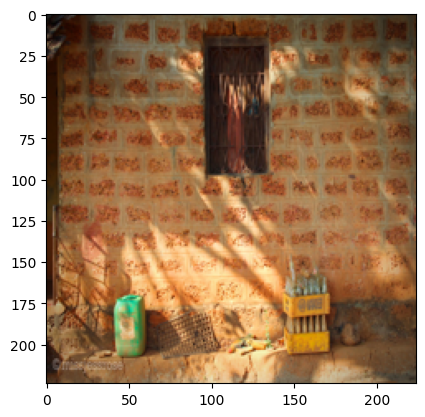

=== Candidate #7 ===
Candidate Caption: 02 behind bells in a temple
Score:0.5522581934928894


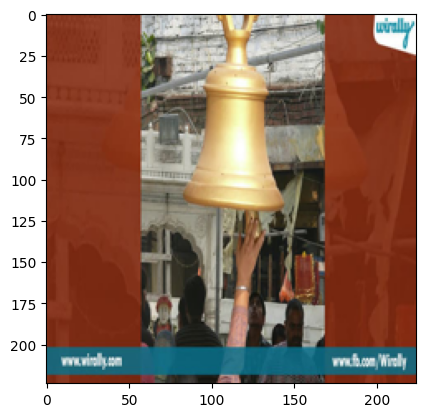

=== Candidate #8 ===
Candidate Caption: in the ministry in the jungle
Score:0.5521160960197449


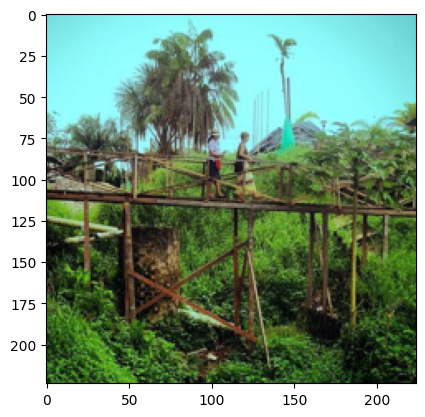

=== Candidate #9 ===
Candidate Caption: youth perform a traditional dance during the award ceremony .
Score:0.5520024299621582


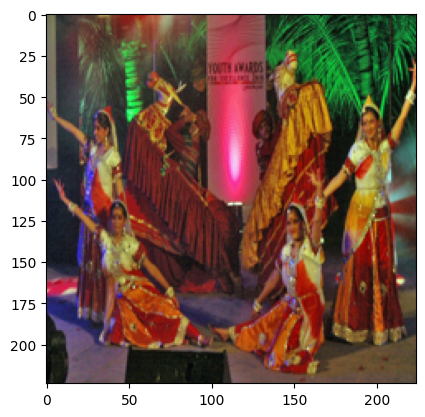

****************************************************************************************************


In [23]:
top_k=10
last_embed = None

mean_ref_score = cc3m_val_ref_scores.mean(dim=0)

sorted_index = np.argsort(np.array(mean_ref_score))[::-1]

print(f"******* Mean Reference *******")
for rank, cand_idx in enumerate(sorted_index[:top_k]):
    print(f"=== Candidate #{rank} ===")
    print(f"Candidate Caption: {cc3m_val_caption[cand_idx]}")
    print(f"Score:{mean_ref_score[cand_idx]}")

    # Display the second PIL Image in the right subplot
    plt.imshow(Image.open(requests.get(cc3m_val_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
    plt.show()
print("*"*100)

## Training

In [16]:
%%time
cc3m_trn_ref_scores = model.similarity(ref_images_embed, cc3m_trn_images_embed)

CPU times: user 4min 54s, sys: 29 s, total: 5min 23s
Wall time: 2min 42s


#### SEA-VQA Sample

******* Reference-0 *******
=== Candidate #0 ===
Reference Caption: Which aspect of Cambodian culture is heavily illustrated in this ancient artifact? Celebratory and martial traditions
Candidate Caption: carving depicting scenes from a military procession of the army
Culture: cambodia
Score:0.8821077942848206


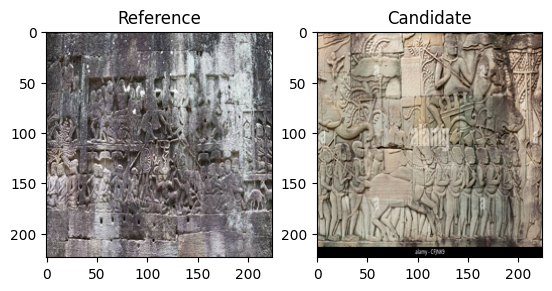

****************************************************************************************************
******* Reference-3 *******
=== Candidate #0 ===
Reference Caption: To what era does this bas-relief belong? 12th-13th century
Candidate Caption: the walls are sculptured covered with bas - relief panels carved into stone , extending over a total length of km
Culture: cambodia
Score:0.8810668587684631


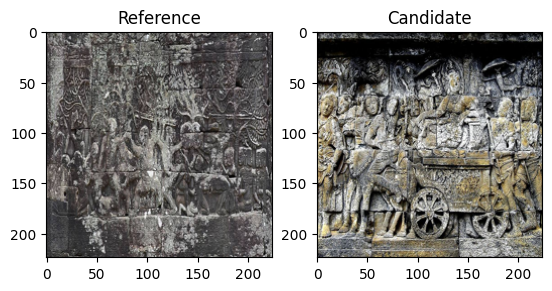

****************************************************************************************************
******* Reference-9 *******
=== Candidate #0 ===
Reference Caption: What could the different colors seen in the decorations signify in Cambodian culture? Representations of different spiritual realms
Candidate Caption: a tree is converted into a red temple .
Culture: cambodia
Score:0.8285558223724365


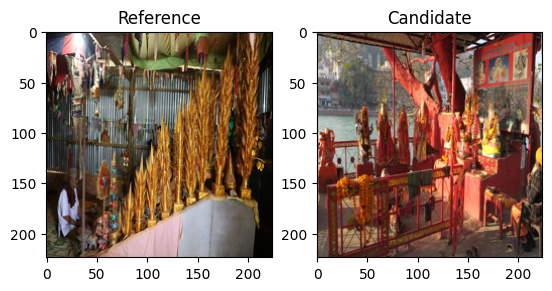

****************************************************************************************************
******* Reference-11 *******
=== Candidate #0 ===
Reference Caption: The facial expressions combined with the gestures in dance primarily aim to: Portray joy and festivity
Candidate Caption: dancers preparing for the show .
Culture: cambodia
Score:0.840921938419342


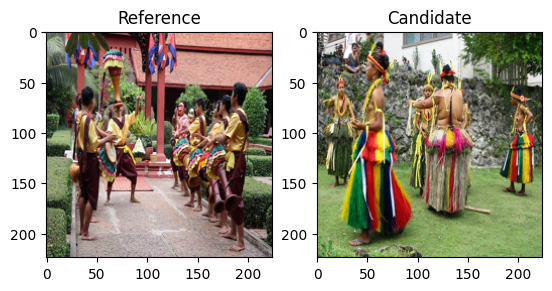

****************************************************************************************************
******* Reference-12 *******
=== Candidate #0 ===
Reference Caption: What is the most probable time of day for this martial arts demonstration based on the lighting and shadows in the image? Midday
Candidate Caption: work in the villages ranges from working in the fields to weaving bamboo for housing or baskets to cutting firewood for cooking and warmth .
Culture: cambodia
Score:0.8100082874298096


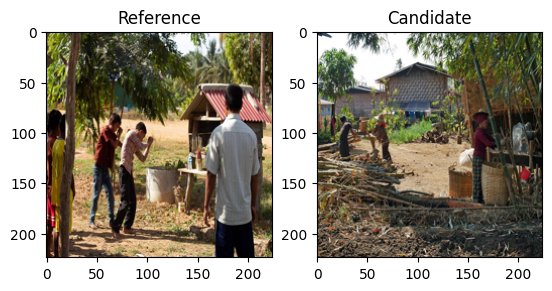

****************************************************************************************************
******* Reference-17 *******
=== Candidate #0 ===
Reference Caption: What notable feature of the event is specifically tied to Cambodian cultural practices? The use of mats for the performance
Candidate Caption: smiling fishermen passing by at the beach
Culture: cambodia
Score:0.822974443435669


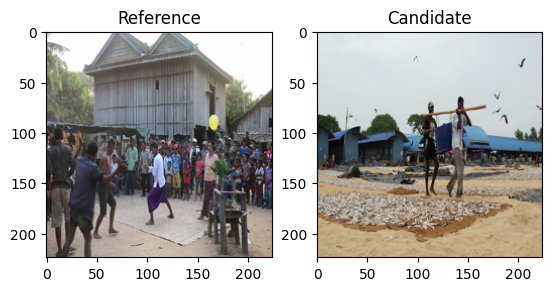

****************************************************************************************************


In [17]:
top_k=1
last_embed = None
for idx in range(20):
    if last_embed is None:
        last_embed = ref_images_embed[idx]
    elif (last_embed == ref_images_embed[idx]).all():
        continue
    elif (last_embed != ref_images_embed[idx]).all():
        last_embed = ref_images_embed[idx]

    sorted_index = np.argsort(np.array(cc3m_trn_ref_scores[idx]))[::-1]
    image = ref_images_filt[idx]
    caption = ref_vqa_caption[idx]
    culture = ref_vqa_culture[idx]

    print(f"******* Reference-{idx} *******")
    for rank, cand_idx in enumerate(sorted_index[:top_k]):
        print(f"=== Candidate #{rank} ===")
        print(f"Reference Caption: {caption}")
        print(f"Candidate Caption: {cc3m_trn_caption[cand_idx]}")
        print(f"Culture: {culture}")
        print(f"Score:{cc3m_trn_ref_scores[idx][cand_idx]}")

        fig, (ax1, ax2) = plt.subplots(1, 2)

        # Display the first PIL Image in the left subplot
        ax1.imshow(image.resize((224, 224), Image.BICUBIC))
        ax1.set_title('Reference')

        # Display the second PIL Image in the right subplot
        ax2.imshow(Image.open(requests.get(cc3m_trn_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
        ax2.set_title('Candidate')
        plt.show()
    print("*"*100)

    if idx == 20:
        break

#### CVQA Sample

******* Reference-3676 *******
=== Candidate #0 ===
Reference Caption: Which building is the souvenir based on? Petronas Twin Towers, Kuala Lumpur Tower, Merdeka 118, The Exchange 106
Candidate Caption: miniature metal souvenir buildings from around the world .
Culture: Sundanese
Score:0.7898212671279907


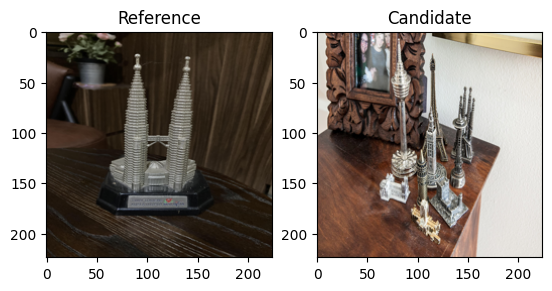

****************************************************************************************************
******* Reference-3677 *******
=== Candidate #0 ===
Reference Caption: What is the name of this monument? Banceuy Prison, Monumen Perjuangan, Gedung Sate, Bandung Lautan Api
Candidate Caption: pan as tourists cross the bridge
Culture: Sundanese
Score:0.7757840752601624


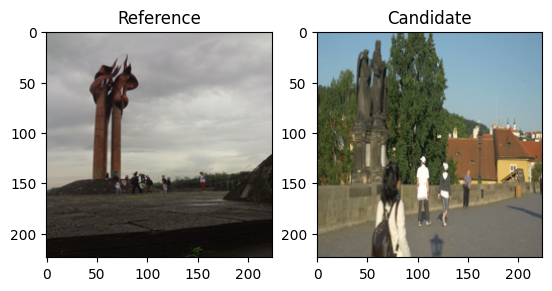

****************************************************************************************************
******* Reference-3678 *******
=== Candidate #0 ===
Reference Caption: What material is used for the roof of the house in this photo? Asbestos, Ceramic, Iron, Rattan
Candidate Caption: rustic huts for about $6 a night .
Culture: Sundanese
Score:0.8850944638252258


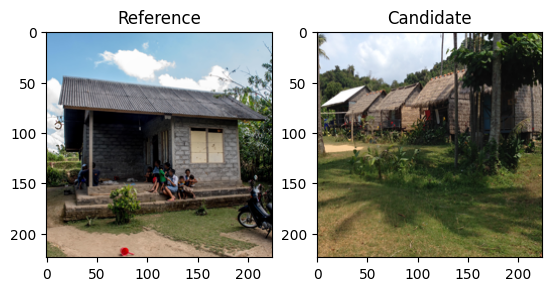

****************************************************************************************************
******* Reference-3679 *******
=== Candidate #0 ===
Reference Caption: What building is this miniature of? Prambanan Temple, Tugu Jogja, Monas, Borobudur Temple
Candidate Caption: this is yet another interpretation of the other pavilion located .
Culture: Sundanese
Score:0.814103901386261


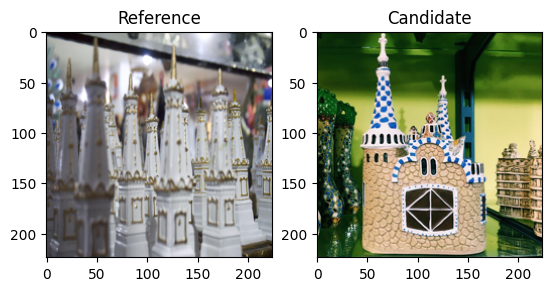

****************************************************************************************************
******* Reference-3680 *******
=== Candidate #0 ===
Reference Caption: Which deity is worshipped on this altar? Buddha, Brahma, Vishnu, Na Tuk Kong
Candidate Caption: your own private cabana amongst the trees .
Culture: Sundanese
Score:0.8293380737304688


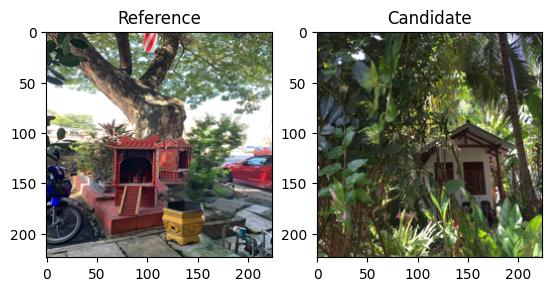

****************************************************************************************************
******* Reference-3681 *******
=== Candidate #0 ===
Reference Caption: What is the use of this tool? Self defense tool, Clothes drying equipment, Cooking tool, Musical instrument
Candidate Caption: under the roof made of dried leaves and stems
Culture: Sundanese
Score:0.859297513961792


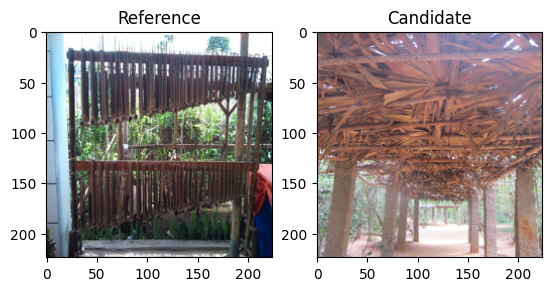

****************************************************************************************************
******* Reference-3682 *******
=== Candidate #0 ===
Reference Caption: What is the name of this building? Soekarno-Hatta Monument, National Inscription, Borobudur Temple, National Monument
Candidate Caption: a city commemorates novelist , the national hero , with a monument .
Culture: Sundanese
Score:0.8274766802787781


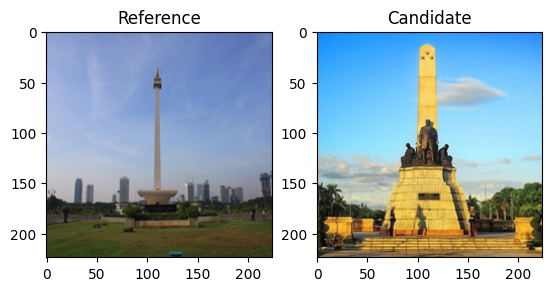

****************************************************************************************************
******* Reference-3683 *******
=== Candidate #0 ===
Reference Caption: Which Indonesian province does this tool come from? West Java, West Sumatra, Bali, Bengkulu
Candidate Caption: under the roof made of dried leaves and stems
Culture: Sundanese
Score:0.859297513961792


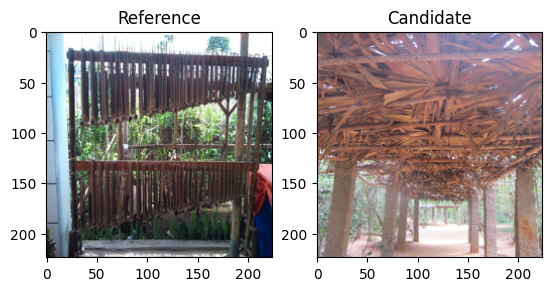

****************************************************************************************************
******* Reference-3684 *******
=== Candidate #0 ===
Reference Caption: What is the name of this building? Government offices, The Sultan Abdul Samad Building, Independence Square, Kuala Lumpur Library
Candidate Caption: this was first grand public building to be built in the - style and it is topped off by - style domes .
Culture: Sundanese
Score:0.9533442258834839


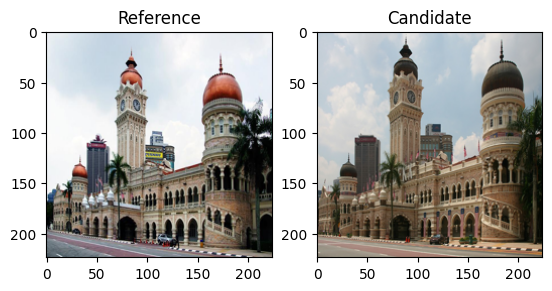

****************************************************************************************************
******* Reference-3685 *******
=== Candidate #0 ===
Reference Caption: What logo is shown in the picture? Telkom University, Harapan Bangsa Institute of Technology, University of Indonesia, Bandung Institute of Technology
Candidate Caption: coin - medal - silver essay of the replica
Culture: Sundanese
Score:0.752739429473877


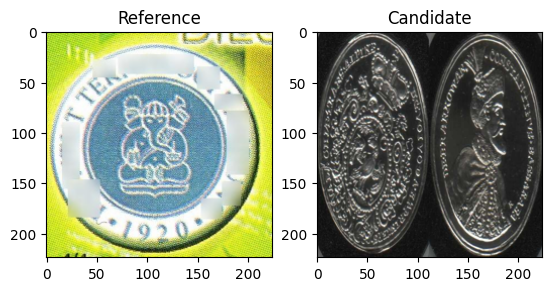

****************************************************************************************************


In [22]:
top_k=1
last_embed = None
for idx in range(len(ref_images_filt) - 10, len(ref_images_filt)):
    if last_embed is None:
        last_embed = ref_images_embed[idx]
    elif (last_embed == ref_images_embed[idx]).all():
        continue
    elif (last_embed != ref_images_embed[idx]).all():
        last_embed = ref_images_embed[idx]

    sorted_index = np.argsort(np.array(cc3m_trn_ref_scores[idx]))[::-1]
    image = ref_images_filt[idx]
    caption = ref_vqa_caption[idx]
    culture = ref_vqa_culture[idx]

    print(f"******* Reference-{idx} *******")
    for rank, cand_idx in enumerate(sorted_index[:top_k]):
        print(f"=== Candidate #{rank} ===")
        print(f"Reference Caption: {caption}")
        print(f"Candidate Caption: {cc3m_trn_caption[cand_idx]}")
        print(f"Culture: {culture}")
        print(f"Score:{cc3m_trn_ref_scores[idx][cand_idx]}")

        fig, (ax1, ax2) = plt.subplots(1, 2)

        # Display the first PIL Image in the left subplot
        ax1.imshow(image.resize((224, 224), Image.BICUBIC))
        ax1.set_title('Reference')

        # Display the second PIL Image in the right subplot
        ax2.imshow(Image.open(requests.get(cc3m_trn_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
        ax2.set_title('Candidate')
        plt.show()
    print("*"*100)

#### Mean Vector

******* Mean Reference *******
=== Candidate #0 ===
Candidate Caption: women cooking something in a temple
Score:0.6074129939079285


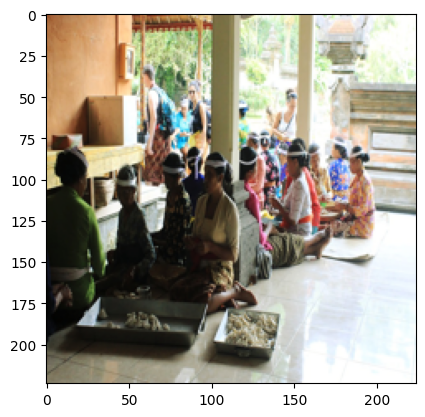

=== Candidate #1 ===
Candidate Caption: a new door in traditional style being fitted
Score:0.6044105887413025


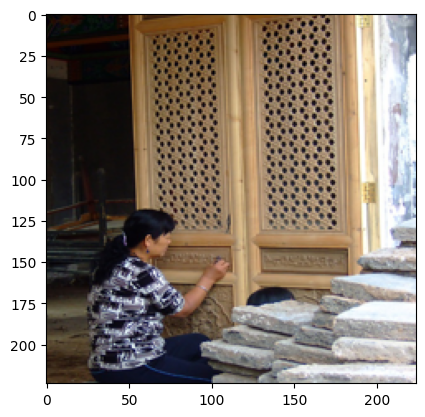

=== Candidate #2 ===
Candidate Caption: waiting outside the temple for father to bless us
Score:0.6024506688117981


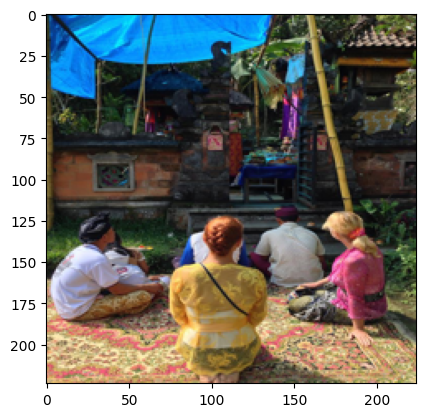

=== Candidate #3 ===
Candidate Caption: dance performance at the end of the tour .
Score:0.5982781052589417


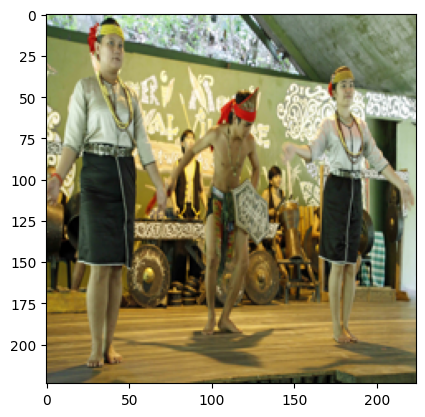

=== Candidate #4 ===
Candidate Caption: this is a typical contrast .
Score:0.5962769985198975


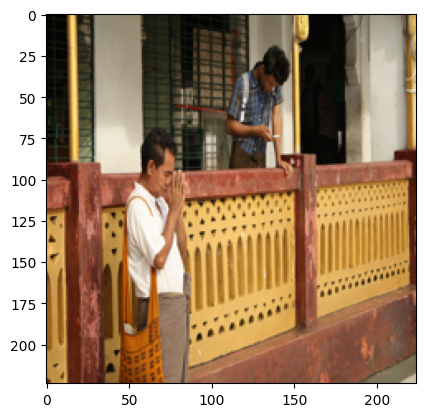

=== Candidate #5 ===
Candidate Caption: food being prepared at a street stall
Score:0.5960966944694519


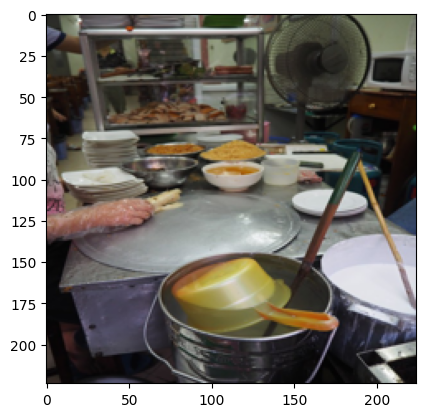

=== Candidate #6 ===
Candidate Caption: man staring out at plastic chair at a temple
Score:0.5953369140625


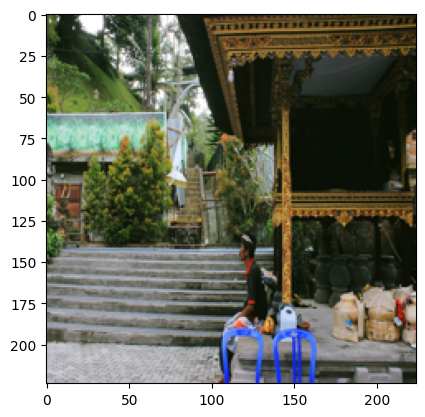

=== Candidate #7 ===
Candidate Caption: typical house with a carved chair on the porch .
Score:0.5952569246292114


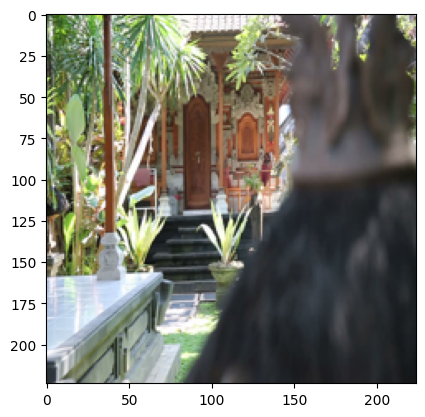

=== Candidate #8 ===
Candidate Caption: a new door in traditional style being fitted
Score:0.5946303009986877


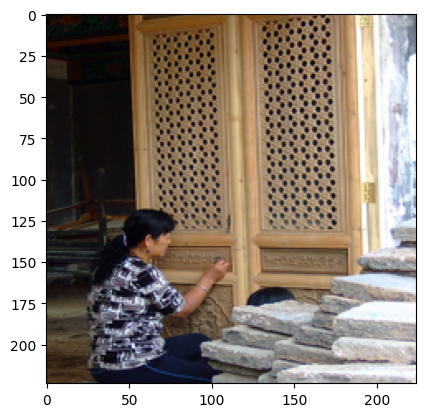

=== Candidate #9 ===
Candidate Caption: devotees give offering for deity as they take part in festival .
Score:0.5939587950706482


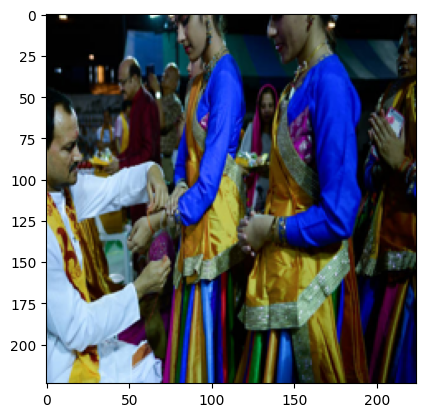

****************************************************************************************************


In [25]:
top_k=10
last_embed = None

mean_ref_score = cc3m_trn_ref_scores.mean(dim=0)

sorted_index = np.argsort(np.array(mean_ref_score))[::-1]

print(f"******* Mean Reference *******")
for rank, cand_idx in enumerate(sorted_index[:top_k]):
    print(f"=== Candidate #{rank} ===")
    print(f"Candidate Caption: {cc3m_trn_caption[cand_idx]}")
    print(f"Score:{mean_ref_score[cand_idx]}")

    # Display the second PIL Image in the right subplot
    plt.imshow(Image.open(requests.get(cc3m_trn_images_filt[cand_idx], stream=True, timeout=5).raw).resize((224, 224), Image.BICUBIC))
    plt.show()
print("*"*100)